<p><font size="5"><b>PROJET AIRBNB - SIMPLON DEV. DATA : PYTHON - FOLIUM _ SEABORN </b></font></p>


<p><font size="4"><b> *Analyse données Airbnb Paris - Mai 2020*</b></font></p>

<p><font size="3"> *Source données : http://insideairbnb.com/get-the-data.html* </font></p>

*© 2020, Gérald Bouget  (<mailto:geraldbouget@gmail.com>)

___

In [1]:
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_seq_items', None)
import numpy as np
import folium
from folium import plugins
import datetime
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import geopandas as gpd
import re
import os
import zipfile
from zipfile import ZipFile
import requests
import gzip

/Users/geraldbouget/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## <div class="alert alert-info"> 1. Loading datasets </div> 

In [4]:
url = 'http://data.insideairbnb.com/france/ile-de-france/paris/2020-05-10/data/listings.csv.gz'

In [5]:
# dataset 'listings' - liste annonces
df_listing = pd.read_csv(url, low_memory=False, compression='gzip')

In [7]:
df_listing.head(2)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,2577,https://www.airbnb.com/rooms/2577,20200510041557,2020-05-12,Loft for 4 by Canal Saint Martin,"100 m2 loft (1100 sq feet) with high ceiling, ...",The district has any service or shop you may d...,"100 m2 loft (1100 sq feet) with high ceiling, ...",none,NaN,NaN,"Metro lines : 4, 8, 3, 11, 9.",NaN,NaN,NaN,NaN,NaN,https://a0.muscache.com/im/pictures/09da057c-0...,NaN,2827,https://www.airbnb.com/users/show/2827,Karine,2008-09-09,"Casablanca, Grand Casablanca, Morocco","Arrivée à Casablanca il y a 4 ans, je suis amo...",within a day,100%,100%,f,https://a0.muscache.com/im/pictures/user/17fe6...,https://a0.muscache.com/im/pictures/user/17fe6...,République,2.0,2.0,"['email', 'phone', 'reviews', 'jumio', 'govern...",t,t,"Paris, Île-de-France, France",République,Entrepôt,NaN,Paris,Île-de-France,75010,Paris,"Paris, France",FR,France,48.86993,2.36251,t,Loft,Entire home/apt,4,2.0,2.0,2.0,Real Bed,"{TV,Internet,Wifi,Kitchen,Heating,Washer,Dryer...",NaN,$125.00,NaN,NaN,$0.00,$40.00,1,$0.00,3,1125,3,3,1125,1125,3.0,1125.0,18 months ago,t,30,60,90,365,2020-05-12,1,0,2019-01-02,2019-01-02,100.0,10.0,10.0,10.0,10.0,10.0,10.0,t,NaN,"{""translation missing: en.occupancy.taxes.juri...",t,f,strict_14_with_grace_period,f,f,1,1,0,0,0.06
1,3109,https://www.airbnb.com/rooms/3109,20200510041557,2020-05-13,zen and calm,Appartement très calme de 50M2 Utilisation de ...,I bedroom appartment in Paris 14,I bedroom appartment in Paris 14 Good restaura...,none,Good restaurants very close the Montparnasse S...,NaN,RER B Metro Ligne 13 Pernety Metro Ligne 13 Pl...,"A la demande, vous pouvez avoir accès à la cha...",yes I can help you out,NaN,NaN,NaN,https://a0.muscache.com/im/pictures/baeae9e2-c...,NaN,3631,https://www.airbnb.com/users/show/3631,Anne,2008-10-14,"Paris, Île-de-France, France",NaN,within a day,100%,50%,f,https://a0.muscache.com/im/users/3631/profile_...,https://a0.muscache.com/im/users/3631/profile_...,Alésia,1.0,1.0,"['email', 'phone', 'facebook', 'reviews']",t,f,"Paris, Île-de-France, France",Alésia,Observatoire,NaN,Paris,Île-de-France,75014,Paris,"Paris, France",FR,France,48.83349,2.31852,f,Apartment,Entire home/apt,2,1.0,0.0,1.0,Real Bed,"{Internet,Wifi,Kitchen,""Paid parking off premi...",NaN,$60.00,$490.00,NaN,$150.00,$60.00,1,$0.00,

In [8]:
# dataset calendar - disponibilités par annonceur et par date
url1='http://data.insideairbnb.com/france/ile-de-france/paris/2020-05-10/data/calendar.csv.gz'
df_calendar=pd.read_csv(url1, low_memory=False, compression='gzip')

In [9]:
df_calendar.head()

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,2577,2020-05-12,t,$125.00,$125.00,3.0,1125.0
1,2577,2020-05-13,t,$125.00,$125.00,3.0,1125.0
2,2577,2020-05-14,t,$125.00,$125.00,3.0,1125.0
3,2577,2020-05-15,t,$125.00,$125.00,3.0,1125.0
4,2577,2020-05-16,t,$125.00,$125.00,3.0,1125.0


In [10]:
# dataset 'neighborhood' - coordonnées au format geojson des quartiers de paris (correspondances variable 'neighborhood'
# du dataset listings)
state_geo = gpd.read_file('http://data.insideairbnb.com/france/ile-de-france/paris/2020-05-10/visualisations/neighbourhoods.geojson')
state_geo.head()

,neighbourhood,neighbourhood_group,geometry
0,Batignolles-Monceau,None,"MULTIPOLYGON (((2.29517 48.87396, 2.29504 48.8..."
1,Palais-Bourbon,None,"MULTIPOLYGON (((2.32090 48.86306, 2.32094 48.8..."
2,Buttes-Chaumont,None,"MULTIPOLYGON (((2.38943 48.90122, 2.39014 48.9..."
3,Opéra,None,"MULTIPOLYGON (((2.33978 48.88203, 2.33982 48.8..."
4,Entrepôt,None,"MULTIPOLYGON (((2.36469 48.88437, 2.36485 48.8..."


## <div class="alert alert-info"> 2. Data cleaning</div> 

### <div class="alert alert-warning"> a. Dataset listings</div> 

In [40]:
# sélection colonnes utiles pour l'analyse

listing_tri = df_listing[['id', 'host_id', 'neighbourhood_cleansed', 'zipcode', 'latitude','longitude','is_location_exact',
'property_type','room_type','accommodates','guests_included','price','extra_people','has_availability','listing_url']]

In [41]:
listing_tri.head()

,id,host_id,neighbourhood_cleansed,zipcode,latitude,longitude,is_location_exact,property_type,room_type,accommodates,guests_included,price,extra_people,has_availability,listing_url
0,2577,2827,Entrepôt,75010,48.86993,2.36251,t,Loft,Entire home/apt,4,1,$125.00,$0.00,t,https://www.airbnb.com/rooms/2577
1,3109,3631,Observatoire,75014,48.83349,2.31852,f,Apartment,Entire home/apt,2,1,$60.00,$0.00,t,https://www.airbnb.com/rooms/3109
2,5396,7903,Hôtel-de-Ville,75004,48.85100,2.35869,t,Apartment,Entire home/apt,2,1,$115.00,$0.00,t,https://www.airbnb.com/rooms/5396
3,7397,2626,Hôtel-de-Ville,75004,48.85758,2.35275,t,Apartment,Entire home/apt,4,2,$119.00,$10.00,t,https://www.airbnb.com/rooms/7397
4,7964,22155,Opéra,75009,48.87417,2.34245,t,Apartment,Entire home/apt,2,2,$130.00,$20.00,t,https://www.airbnb.com/rooms/7964


In [42]:
listing_tri.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66900 entries, 0 to 66899
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      66900 non-null  int64  
 1   host_id                 66900 non-null  int64  
 2   neighbourhood_cleansed  66900 non-null  object 
 3   zipcode                 66296 non-null  object 
 4   latitude                66900 non-null  float64
 5   longitude               66900 non-null  float64
 6   is_location_exact       66900 non-null  object 
 7   property_type           66900 non-null  object 
 8   room_type               66900 non-null  object 
 9   accommodates            66900 non-null  int64  
 10  guests_included         66900 non-null  int64  
 11  price                   66900 non-null  object 
 12  extra_people            66900 non-null  object 
 13  has_availability        66900 non-null  object 
 14  listing_url             66900 non-null

In [43]:
# vérification valeurs nulles
listing_tri.isna().sum()

id                          0
host_id                     0
neighbourhood_cleansed      0
zipcode                   604
latitude                    0
longitude                   0
is_location_exact           0
property_type               0
room_type                   0
accommodates                0
guests_included             0
price                       0
extra_people                0
has_availability            0
listing_url                 0
dtype: int64

In [44]:
# nettoyage colonne prix : enlever signe $, enlever ',' et '.'
def prix_clean(x): #creation fonction pour appliquer les différents filtres en une seule fois
    if type(x)!=float:
        
        s = re.compile(r'\$|\.00|,')
        return s.sub('', x)
    elif type(x)==float:
        return x

In [45]:
# colonne prix
listing_tri.loc[:,'price']=listing_tri.loc[:,'price'].apply(prix_clean)

/Users/geraldbouget/opt/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:966: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


In [46]:
# colonne prix : conversion numérique
listing_tri.loc[:,'price'] = pd.to_numeric(listing_tri.loc[:,'price'])

In [47]:
# colonne extra_people
listing_tri.loc[:,'extra_people']=listing_tri.loc[:,'extra_people'].apply(prix_clean)

In [48]:
# colonne extra_people : conversion numérique
listing_tri.loc[:,'extra_people'] = pd.to_numeric(listing_tri.loc[:,'extra_people'])

In [49]:
listing_tri.head()

,id,host_id,neighbourhood_cleansed,zipcode,latitude,longitude,is_location_exact,property_type,room_type,accommodates,guests_included,price,extra_people,has_availability,listing_url
0,2577,2827,Entrepôt,75010,48.86993,2.36251,t,Loft,Entire home/apt,4,1,125,0,t,https://www.airbnb.com/rooms/2577
1,3109,3631,Observatoire,75014,48.83349,2.31852,f,Apartment,Entire home/apt,2,1,60,0,t,https://www.airbnb.com/rooms/3109
2,5396,7903,Hôtel-de-Ville,75004,48.85100,2.35869,t,Apartment,Entire home/apt,2,1,115,0,t,https://www.airbnb.com/rooms/5396
3,7397,2626,Hôtel-de-Ville,75004,48.85758,2.35275,t,Apartment,Entire home/apt,4,2,119,10,t,https://www.airbnb.com/rooms/7397
4,7964,22155,Opéra,75009,48.87417,2.34245,t,Apartment,Entire home/apt,2,2,130,20,t,https://www.airbnb.com/rooms/7964


In [50]:
# new dataframe pour dataset listing clean
listing_clean = listing_tri.copy()

### <div class="alert alert-warning"> b. Dataset calendar</div> 

In [51]:
df_calendar.head(1)

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,2577,2020-05-12,t,$125.00,$125.00,3.0,1125.0


In [52]:
df_calendar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24419217 entries, 0 to 24419216
Data columns (total 7 columns):
 #   Column          Dtype         
---  ------          -----         
 0   listing_id      int64         
 1   date            datetime64[ns]
 2   available       object        
 3   price           object        
 4   adjusted_price  object        
 5   minimum_nights  float64       
 6   maximum_nights  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 1.3+ GB


In [58]:
df_calendar.isna().sum()

listing_id           0
date                 0
available            0
price             8076
adjusted_price    8076
minimum_nights     405
maximum_nights     405
dtype: int64

In [54]:
# conversion colonne 'date' en format date
df_calendar['date']=pd.to_datetime(df_calendar['date'])

In [55]:
# conversion colonnes prix en format numérique
df_calendar.loc[:,'price']=df_calendar.loc[:,'price'].apply(prix_clean)

In [56]:
df_calendar.loc[:,'price'] = pd.to_numeric(df_calendar.loc[:,'price'])

In [57]:
df_calendar.head()

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,2577,2020-05-12,t,125.0,$125.00,3.0,1125.0
1,2577,2020-05-13,t,125.0,$125.00,3.0,1125.0
2,2577,2020-05-14,t,125.0,$125.00,3.0,1125.0
3,2577,2020-05-15,t,125.0,$125.00,3.0,1125.0
4,2577,2020-05-16,t,125.0,$125.00,3.0,1125.0


In [59]:
df_calendar.loc[:,'adjusted_price']=df_calendar.loc[:,'adjusted_price'].apply(prix_clean)

In [60]:
df_calendar.loc[:,'adjusted_price'] = pd.to_numeric(df_calendar.loc[:,'adjusted_price'])

In [61]:
df_calendar.head()

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,2577,2020-05-12,t,125.0,125.0,3.0,1125.0
1,2577,2020-05-13,t,125.0,125.0,3.0,1125.0
2,2577,2020-05-14,t,125.0,125.0,3.0,1125.0
3,2577,2020-05-15,t,125.0,125.0,3.0,1125.0
4,2577,2020-05-16,t,125.0,125.0,3.0,1125.0


In [62]:
df_calendar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24419217 entries, 0 to 24419216
Data columns (total 7 columns):
 #   Column          Dtype         
---  ------          -----         
 0   listing_id      int64         
 1   date            datetime64[ns]
 2   available       object        
 3   price           float64       
 4   adjusted_price  float64       
 5   minimum_nights  float64       
 6   maximum_nights  float64       
dtypes: datetime64[ns](1), float64(4), int64(1), object(1)
memory usage: 1.3+ GB


In [63]:
# conversoin TRUE/FALSE
bool_list = {'t': True, 'f': False}
df_calendar['available']=df_calendar['available'].map(bool_list)


In [64]:
calendar_clean = df_calendar.copy()

## <div class="alert alert-info"> 3. Data analyse</div> 

### <div class="alert alert-warning"> a. Number of listings per neighborhood</div> 

In [65]:
# selection annonces available
nbr = listing_clean[listing_clean.has_availability=='t']

In [66]:
#création dataframe du nombre d'annnonces par quartiers
nbr = nbr[['id','neighbourhood_cleansed']].groupby('neighbourhood_cleansed').count().sort_values(by='id', ascending=False)
nbr.reset_index(0, inplace=True)
nbr.rename(columns={'id':'Nb_annonces', 'neighbourhood_cleansed':'lieu'}, inplace=True)
nbr.head()

,lieu,Nb_annonces
0,Buttes-Montmartre,7427
1,Popincourt,6542
2,Vaugirard,5006
3,Entrepôt,4644
4,Batignolles-Monceau,4522


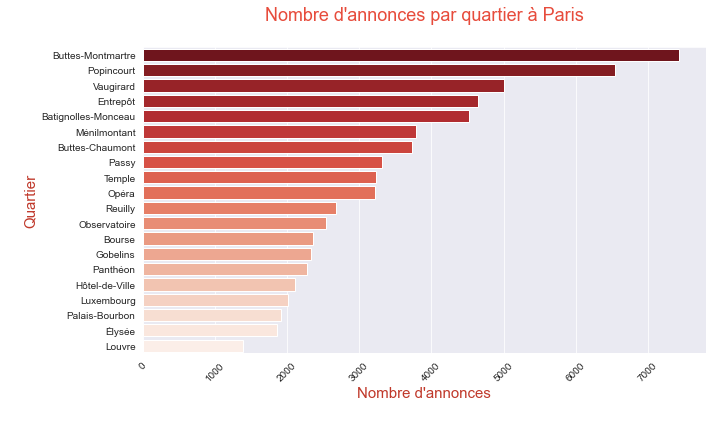

In [67]:
plt.figure(figsize=(10,6))
sns.set_style("darkgrid")
sns.barplot(y=nbr['lieu'], x=nbr['Nb_annonces'], palette="Reds_r") #utilisation seaborn barplot
plt.ylabel('\nQuartier', fontsize=15, color='#c0392b')
plt.xlabel("Nombre d'annonces\n", fontsize=15, color='#c0392b')
plt.title("Nombre d'annonces par quartier à Paris\n", fontsize=18, color='#e74c3c')
plt.xticks(rotation= 45)
plt.tight_layout()

### <div class="alert alert-warning"> b. Property types</div> 

In [68]:
# creation sub dataset du n ombre d'annnoces par type de chambre et type de logement
prop = listing_clean[['id','property_type', 'room_type']].groupby(['property_type', 'room_type']).count().sort_values(by='id', ascending=False)
prop.rename(columns={'id':'Nb_annonces'}, inplace=True)
prop.head()

Nb_annonces
property_type  room_type                   
Apartment      Entire home/apt        53896
               Private room            5723
Condominium    Entire home/apt         1705
Loft           Entire home/apt         1119
Boutique hotel Hotel room              1113

In [69]:
prop_filter = prop[prop.Nb_annonces>50] # filtre sur nombre d'annonces minimum

In [70]:
# Sorting the first level index according to its total sum
s_sort = prop_filter.groupby(level=[0]).sum().sort_values(by='Nb_annonces',ascending=True) 

In [71]:
s_sort.head(4)

,Nb_annonces
property_type,
Guesthouse,54
Other,54
Bed and breakfast,124
Aparthotel,210


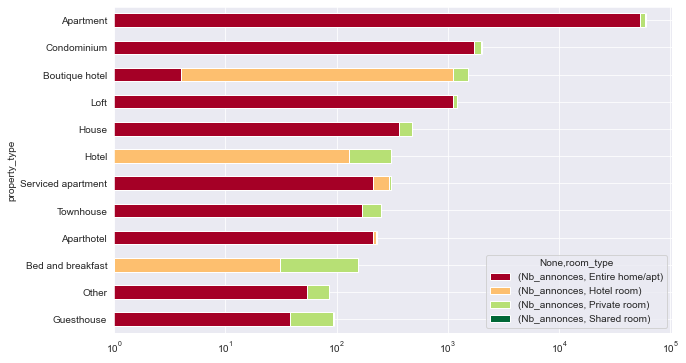

In [72]:
# Reindex back using the new sorted index values in the first level + unstack + plot:
# goal = displaying sorting plots
# usage de logx=True pour modifier écehlle d'affichage car sinon trop grande différence entre nombre max et reste
prop.reindex(index=s_sort.index, level=0).unstack().plot(kind='barh',stacked=True, logx=True,figsize=(10,6),colormap='RdYlGn')



### <div class="alert alert-warning"> c. Accommodates</div> 

In [73]:
# création dataframe du nombre de logement par 'accomodate'
accom = listing_clean[['id','accommodates']].groupby('accommodates').count().sort_values(by='id',ascending=0)
accom.reset_index(0, inplace=True)
accom.rename(columns={'id':'Nb_annonces'}, inplace=True)
accom.head()

,accommodates,Nb_annonces
0,2,32432
1,4,16912
2,3,6384
3,6,3660
4,1,3065


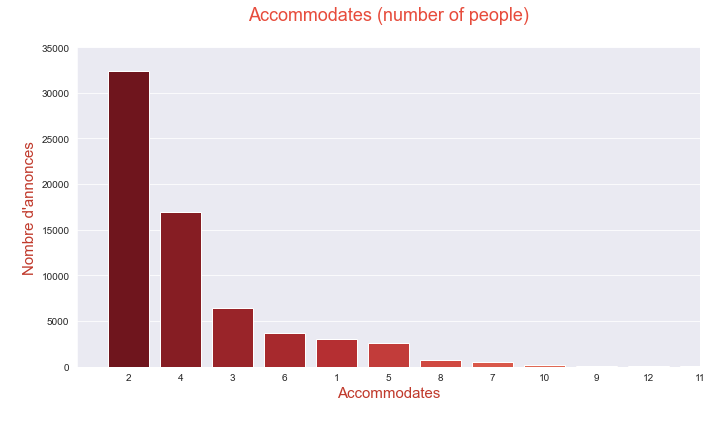

In [74]:
plt.figure(figsize=(10,6))
sns.set_style("darkgrid")
sns.barplot(x=accom['accommodates'], y=accom['Nb_annonces'], palette="Reds_r", order=accom['accommodates'])
plt.ylabel('\nNombre d\'annonces', fontsize=15, color='#c0392b')
plt.xlabel("Accommodates\n", fontsize=15, color='#c0392b')
plt.title("Accommodates (number of people)\n", fontsize=18, color='#e74c3c')
plt.axis([-1,11,0,35000]) #pour resserrer la visualisation sur données pertinentes (virer espace vide (xlimgauche,
# xlimdroite, ylimbas, ylimhaut))
#plt.xticks(rotation= 45)
plt.tight_layout()

### <div class="alert alert-warning"> d. Availabilities per date</div> 

In [75]:
calendar_clean.head()

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,2577,2020-05-12,True,125.0,125.0,3.0,1125.0
1,2577,2020-05-13,True,125.0,125.0,3.0,1125.0
2,2577,2020-05-14,True,125.0,125.0,3.0,1125.0
3,2577,2020-05-15,True,125.0,125.0,3.0,1125.0
4,2577,2020-05-16,True,125.0,125.0,3.0,1125.0


In [76]:
# creation df variables utiles
df5 = calendar_clean[['listing_id', 'date', 'available']]

In [77]:
# filtre sur annonces disponibles
df54=df5[df5.available==True]
df54.head(4)

,listing_id,date,available
0,2577,2020-05-12,True
1,2577,2020-05-13,True
2,2577,2020-05-14,True
3,2577,2020-05-15,True


In [78]:
# df pour avoir nombre d'annonces disponibles par jour
df_j=df54.groupby('date').listing_id.count().to_frame()
df_j=df_j[df_j.index>='2020-04-01'] #filtre pour débuter analyse à partir du 1er avril (dataset date=fin mars non relevant)
df_j.head(5)

,listing_id
date,
2020-05-10,101
2020-05-11,935
2020-05-12,4363
2020-05-13,10094
2020-05-14,13931


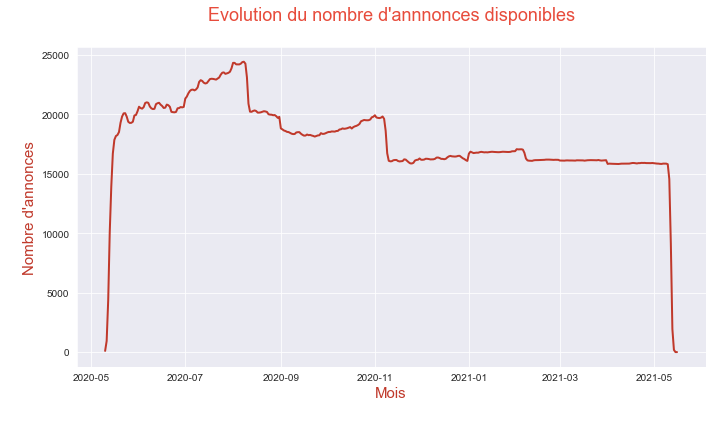

In [79]:
#sns.set(style="whitegrid")
sns.set_style("darkgrid")
plt.figure(figsize=(10,6))
sns.lineplot(x=df_j.index, y=df_j.listing_id, color="#c0392b", linewidth=2)
plt.ylabel('\nNombre d\'annonces', fontsize=15, color='#c0392b')
plt.xlabel("Mois\n", fontsize=15, color='#c0392b')
plt.title("Evolution du nombre d'annnonces disponibles\n", fontsize=18, color='#e74c3c')
#plt.axis([-1,11,0,35000]) #pour resserrer la visualisation sur données pertinentes (virer espace vide (xlimgauche,
# xlimdroite, ylimbas, ylimhaut))
#plt.xticks(rotation= 45)
plt.tight_layout()

### <div class="alert alert-warning"> d. Average price available for 2 persons by date</div> 

In [80]:
#création colonnes prix moyen
listing_clean['prix_moyen']=''

In [81]:
#calcul du prix moyen pour 2 personnes (en fonction du prix affiché, du nombre de personnes inclu dans le prix et 
# du montant extrat par personnes en plus)
for i in range(len(listing_clean.index)):
        if listing_clean.iloc[i, 10] == 2:
            listing_clean.iloc[i, 15] = listing_clean.iloc[i, 11]
        #elif listing_clean.iloc[i, 10] !=2 and listing_clean.iloc[i, 12]==0:
            #listing_clean.iloc[i, 15] = listing_clean.iloc[i, 11]
        elif listing_clean.iloc[i, 10] ==1:
            listing_clean.iloc[i, 15] = listing_clean.iloc[i, 11]+listing_clean.iloc[i, 12]
        elif listing_clean.iloc[i, 10] > 2:
            listing_clean.iloc[i, 15] = listing_clean.iloc[i, 11]/(listing_clean.iloc[i, 10]/2)
            
        
    

In [82]:
listing_clean.head()

,id,host_id,neighbourhood_cleansed,zipcode,latitude,longitude,is_location_exact,property_type,room_type,accommodates,guests_included,price,extra_people,has_availability,listing_url,prix_moyen
0,2577,2827,Entrepôt,75010,48.86993,2.36251,t,Loft,Entire home/apt,4,1,125,0,t,https://www.airbnb.com/rooms/2577,125
1,3109,3631,Observatoire,75014,48.83349,2.31852,f,Apartment,Entire home/apt,2,1,60,0,t,https://www.airbnb.com/rooms/3109,60
2,5396,7903,Hôtel-de-Ville,75004,48.85100,2.35869,t,Apartment,Entire home/apt,2,1,115,0,t,https://www.airbnb.com/rooms/5396,115
3,7397,2626,Hôtel-de-Ville,75004,48.85758,2.35275,t,Apartment,Entire home/apt,4,2,119,10,t,https://www.airbnb.com/rooms/7397,119
4,7964,22155,Opéra,75009,48.87417,2.34245,t,Apartment,Entire home/apt,2,2,130,20,t,https://www.airbnb.com/rooms/7964,130


In [83]:
# sélection variables utiles
liste_prix_moyen = listing_clean[['id', 'price', 'prix_moyen', 'neighbourhood_cleansed']]

In [84]:
# merge avec tableau calendar sur 'listing_id'
df_average = pd.merge(calendar_clean, liste_prix_moyen.rename(columns={'id':'listing_id'}))

In [85]:
# conversion variable prix_moyen en numérique
df_average.loc[:,'prix_moyen'] = pd.to_numeric(df_average.loc[:,'prix_moyen'])

In [86]:
df_average.head(4)

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights,prix_moyen,neighbourhood_cleansed
0,2577,2020-05-12,True,125.0,125.0,3.0,1125.0,125.0,Entrepôt
1,2577,2020-05-13,True,125.0,125.0,3.0,1125.0,125.0,Entrepôt
2,2577,2020-05-14,True,125.0,125.0,3.0,1125.0,125.0,Entrepôt
3,2577,2020-05-15,True,125.0,125.0,3.0,1125.0,125.0,Entrepôt


In [87]:
df_average=df_average[df_average.available==True] #filtre pour avoir annonces disponibles only

In [88]:
df_average.head(3)

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights,prix_moyen,neighbourhood_cleansed
0,2577,2020-05-12,True,125.0,125.0,3.0,1125.0,125.0,Entrepôt
1,2577,2020-05-13,True,125.0,125.0,3.0,1125.0,125.0,Entrepôt
2,2577,2020-05-14,True,125.0,125.0,3.0,1125.0,125.0,Entrepôt


In [89]:
# df prix moyen par date
a=df_average.groupby('date').prix_moyen.mean().to_frame()
a=a[a.index>='2020-04-01']
a.head()

,prix_moyen
date,
2020-05-10,110.212644
2020-05-11,208.455681
2020-05-12,197.210035
2020-05-13,196.854932
2020-05-14,180.557975


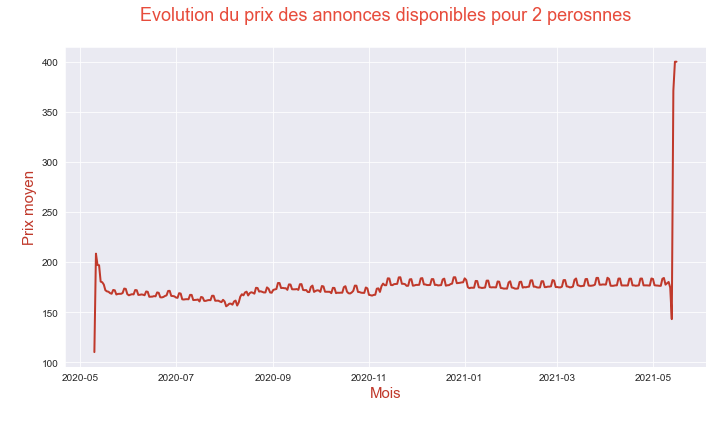

In [90]:
sns.set_style("darkgrid")
plt.figure(figsize=(10,6))
sns.lineplot(x=a.index, y=a.prix_moyen, color="#c0392b", linewidth=2)
plt.ylabel('\nPrix moyen', fontsize=15, color='#c0392b')
plt.xlabel("Mois\n", fontsize=15, color='#c0392b')
plt.title("Evolution du prix des annonces disponibles pour 2 perosnnes\n", fontsize=18, color='#e74c3c')
#plt.axis([-1,11,0,35000]) #pour resserrer la visualisation sur données pertinentes (virer espace vide (xlimgauche,
# xlimdroite, ylimbas, ylimhaut))
#plt.xticks(rotation= 45)
plt.tight_layout()

### <div class="alert alert-warning"> d.Average daily price for 2 persons accommodation </div> 

In [91]:
# df des prix moyen des annonces disponible sur période total du dataset
df_quartiers= df_average.groupby('neighbourhood_cleansed').prix_moyen.mean().sort_values(ascending=False).to_frame()
df_quartiers.head(3)

,prix_moyen
neighbourhood_cleansed,
Reuilly,264.053680
Élysée,257.667551
Passy,238.891850


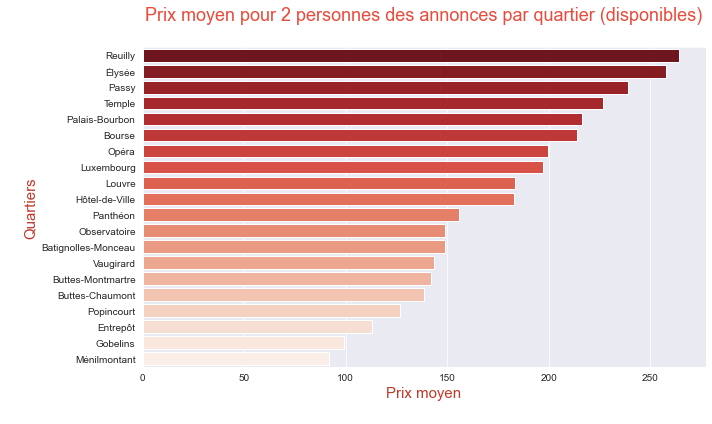

In [92]:
sns.set_style("darkgrid")
plt.figure(figsize=(10,6))
sns.barplot(y=df_quartiers.index, x=df_quartiers.prix_moyen, palette="Reds_r")
plt.ylabel('\nQuartiers', fontsize=15, color='#c0392b')
plt.xlabel("Prix moyen\n", fontsize=15, color='#c0392b')
plt.title("Prix moyen pour 2 personnes des annonces par quartier (disponibles)\n", fontsize=18, color='#e74c3c')
#plt.axis([-1,11,0,35000]) #pour resserrer la visualisation sur données pertinentes (virer espace vide (xlimgauche,
# xlimdroite, ylimbas, ylimhaut))
#plt.xticks(rotation= 45)
plt.tight_layout()

### <div class="alert alert-warning"> e.Map visualization - clusters </div> 

In [93]:
listing_clean.head(2)

,id,host_id,neighbourhood_cleansed,zipcode,latitude,longitude,is_location_exact,property_type,room_type,accommodates,guests_included,price,extra_people,has_availability,listing_url,prix_moyen
0,2577,2827,Entrepôt,75010,48.86993,2.36251,t,Loft,Entire home/apt,4,1,125,0,t,https://www.airbnb.com/rooms/2577,125
1,3109,3631,Observatoire,75014,48.83349,2.31852,f,Apartment,Entire home/apt,2,1,60,0,t,https://www.airbnb.com/rooms/3109,60


In [94]:
# df coordonnées
df_coord=listing_clean[listing_clean.has_availability=='t']
df_coord=listing_clean[['latitude', 'longitude']]

In [95]:
df_coord.head(4)

,latitude,longitude
0,48.86993,2.36251
1,48.83349,2.31852
2,48.85100,2.35869
3,48.85758,2.35275


In [97]:
#carte folium
from folium.plugins import MarkerCluster

# définition clusters pour inclure sur map (instanciation classe MarkerCluster)
mc = MarkerCluster()#creating a Marker for each point in df_sample. Each point will get a popup with their zip

# iteration dans chaque ligne de df.coord (tuples) et ajout à markercluster class
for row in df_coord.itertuples():
    mc.add_child(folium.Marker(location=[row.latitude,  row.longitude]))

# définition carte de départ
some_map = folium.Map(location=[df_coord['latitude'].mean(), df_coord['longitude'].mean()], zoom_start=12) 

#ajout clusters sur la carte
some_map.add_child(mc) 

#sauvegarde carte
#some_map.save(os.path.join('results', 'carte1.html')) 

some_map

In [98]:
# creation df variables utilise pour choropleth map
dfc=listing_clean[['id', 'neighbourhood_cleansed', 'has_availability']]

In [99]:
dfc=dfc[dfc.has_availability=='t']

In [100]:
dfc2=dfc.groupby('neighbourhood_cleansed').id.count()
dfc3=dfc2.to_frame()
dfc3.reset_index(inplace=True)

In [101]:
dfc3.head(4) # nombre d'annonces dispo par quartier

,neighbourhood_cleansed,id
0,Batignolles-Monceau,4522
1,Bourse,2358
2,Buttes-Chaumont,3736
3,Buttes-Montmartre,7427


In [102]:
new=dfc3.copy()

In [105]:
#loading geojson file
nil = gpd.read_file('http://data.insideairbnb.com/france/ile-de-france/paris/2020-05-10/visualisations/neighbourhoods.geojson')

In [106]:
nil.head()

,neighbourhood,neighbourhood_group,geometry
0,Batignolles-Monceau,None,"MULTIPOLYGON (((2.29517 48.87396, 2.29504 48.8..."
1,Palais-Bourbon,None,"MULTIPOLYGON (((2.32090 48.86306, 2.32094 48.8..."
2,Buttes-Chaumont,None,"MULTIPOLYGON (((2.38943 48.90122, 2.39014 48.9..."
3,Opéra,None,"MULTIPOLYGON (((2.33978 48.88203, 2.33982 48.8..."
4,Entrepôt,None,"MULTIPOLYGON (((2.36469 48.88437, 2.36485 48.8..."


In [107]:
nil=nil[['neighbourhood','geometry']]
nil.head()

,neighbourhood,geometry
0,Batignolles-Monceau,"MULTIPOLYGON (((2.29517 48.87396, 2.29504 48.8..."
1,Palais-Bourbon,"MULTIPOLYGON (((2.32090 48.86306, 2.32094 48.8..."
2,Buttes-Chaumont,"MULTIPOLYGON (((2.38943 48.90122, 2.39014 48.9..."
3,Opéra,"MULTIPOLYGON (((2.33978 48.88203, 2.33982 48.8..."
4,Entrepôt,"MULTIPOLYGON (((2.36469 48.88437, 2.36485 48.8..."


In [108]:
new.head()

,neighbourhood_cleansed,id
0,Batignolles-Monceau,4522
1,Bourse,2358
2,Buttes-Chaumont,3736
3,Buttes-Montmartre,7427
4,Entrepôt,4644


In [109]:
new.rename(columns={'neighbourhood_cleansed':'neighbourhood'}, inplace=True)

In [110]:
# merge df geojson et new sur noms de quartiers
nilpop=nil.merge(new,on="neighbourhood")

nilpop



,neighbourhood,geometry,id
0,Batignolles-Monceau,"MULTIPOLYGON (((2.29517 48.87396, 2.29504 48.8...",4522
1,Palais-Bourbon,"MULTIPOLYGON (((2.32090 48.86306, 2.32094 48.8...",1919
2,Buttes-Chaumont,"MULTIPOLYGON (((2.38943 48.90122, 2.39014 48.9...",3736
3,Opéra,"MULTIPOLYGON (((2.33978 48.88203, 2.33982 48.8...",3213
4,Entrepôt,"MULTIPOLYGON (((2.36469 48.88437, 2.36485 48.8...",4644
5,Gobelins,"MULTIPOLYGON (((2.37491 48.83801, 2.37698 48.8...",2334
6,Vaugirard,"MULTIPOLYGON (((2.29932 48.85217, 2.30088 48.8...",5006
7,Reuilly,"MULTIPOLYGON (((2.41388 48.83357, 2.41401 48.8...",2675
8,Louvre,"MULTIPOLYGON (((2.32801 48.86992, 2.32997 48.8...",1391
9,Luxembourg,"MULTIPOLYGON (((2.34459 48.85405, 2.34428 48.8...",2015


In [118]:
# création carte de départ
m2 = folium.Map([48.86031970792134, 2.344467863359848], zoom_start=12)

In [120]:
#définition format overlays:
style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}

# création choropleths classe
folium.Choropleth(
    geo_data=nilpop,
    name='choropleth',
    data=nilpop,
    columns=['neighbourhood','id'],
    key_on='feature.properties.neighbourhood', #cle de jointure entre fichier geojson et fichier data
    fill_color='YlGn',
    fill_opacity=0.7,
    style_function=style_function,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['neighbourhood', 'id'],
        aliases=['neighborhood: ', 'Nombre total d\'offre d\'hébergement'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;") 
    ),
    control=False,
    highlight_function=highlight_function,
    line_opacity=0.2,
    legend_name='Visualisation des locations disponibles',
    highlight=True,
    overlay=True
).add_to(m2)


folium.LayerControl().add_to(m2)
#m2.save(os.path.join('results', 'carte2b.html'))
m2